# 1. Preparando o ambiente

In [1]:
import cv2
cv2.__version__

'4.10.0'

In [2]:
import dlib
dlib.__version__

'19.24.2'

In [3]:
#%pip install seaborn #caso nao esteja instalado

In [4]:
#%pip install matplotlib 

In [5]:
import matplotlib.pyplot as plt
import seaborn

In [6]:
seaborn.__version__

'0.13.2'

# 2. Abrindo uma imagem

In [ ]:
imagem = cv2.imread("imagens/px-girl.jpg")
plt.imshow(imagem)

In [ ]:
#transformando a imagem em RGB por causa do opencv
imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB) 
plt.imshow(imagem_rgb)

In [ ]:
#avaliando os parâmetros da imagem tamanho e canais
imagem_rgb.shape

In [ ]:
imagem_gray = cv2.cvtColor(imagem_rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(imagem_gray, cmap="gray")  #indicando para o matplot que a imagem é em escala de cinza

In [ ]:
#avaliando os parâmetros da imagem tamanho e canais (rgb)
imagem_gray.shape

In [ ]:
imagem = cv2.imread("imagens/px-people.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(imagem)

In [ ]:
imagem.shape

# 3. Obtendo uma região de interesse - Manualmente

In [ ]:
imagem_roi = imagem[100:200, 1000:1200]
plt.imshow(imagem_roi)

Essa imagem vai ficar azul, porque foi usado a variável imagem_roi (que está em rgb) para escrever no arquivo. A função que escreve o arquivo é nativa do opencv, por isso precisamos passar a imagem para o "formato original" do opencv - bgr

In [ ]:
cv2.imwrite("imagens/imagem_roi.png", imagem_roi)

Convertendo as cores e criando um novo arquivo a cor da imagem volta para o formato esperado

In [ ]:
imagem_roi_bgr = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
cv2.imwrite("imagens/imagem_roi_2.png", imagem_roi_bgr)

## Exercicio

1 - ler e plotar a imagem para identificar a região de interesse

In [ ]:
imagem = cv2.imread("imagens/exercicio_1.png")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(imagem)
plt.title("Garota")

2 - Obter a região de interesse e plotar

In [ ]:
imagem_roi = imagem[220:370, 510:650]
plt.imshow(imagem_roi)
plt.title("Corpo inteiro")

3 - transformar a região de interesse em cinza e plotar

In [ ]:
imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2GRAY)
plt.imshow(imagem_roi, cmap="gray")
plt.title("Região de interesse")

4 - converter a região de interesse de cinza para rgb e inserir na imagem original

In [ ]:
#convertendo a imagem de cinza para rgb para sobrescrever na imagem original
roi_rgb = cv2.cvtColor(imagem_roi, cv2.COLOR_GRAY2RGB)

imagem[220:370, 510:650] = roi_rgb
plt.imshow(imagem)
plt.title("Resultado Final")

# 4. Obtendo uma região de interesse - Automaticamente

Para isso será utilizado o método em cascata de Haar, que possui uma execução muito rápida. 

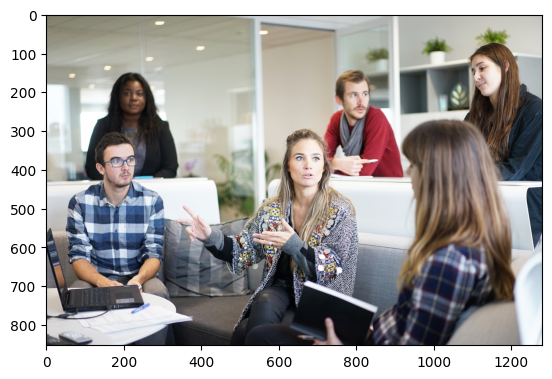

In [7]:
imagem = cv2.imread("imagens/px-people.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(imagem)

In [8]:
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)

In [9]:
#instanciando o classificador. Outros estão disponíveis no repositório da opencv
classificador = cv2.CascadeClassifier("classificadores/haarcascade_frontalface_default.xml")

In [10]:
# a estratégia do haar cascade é fazer um reconhecimento e reduzir a imagem
# 1.3 escala - diminuir 30%
# 5 - número mínimo de características vizinhas
faces = classificador.detectMultiScale(imagem_gray, 1.3,5)

In [11]:
len(faces)

5

In [12]:
#Identifica os pontos da face
faces[0]

array([1088,  102,  101,  101])

In [13]:
imagem_anotada = imagem.copy()

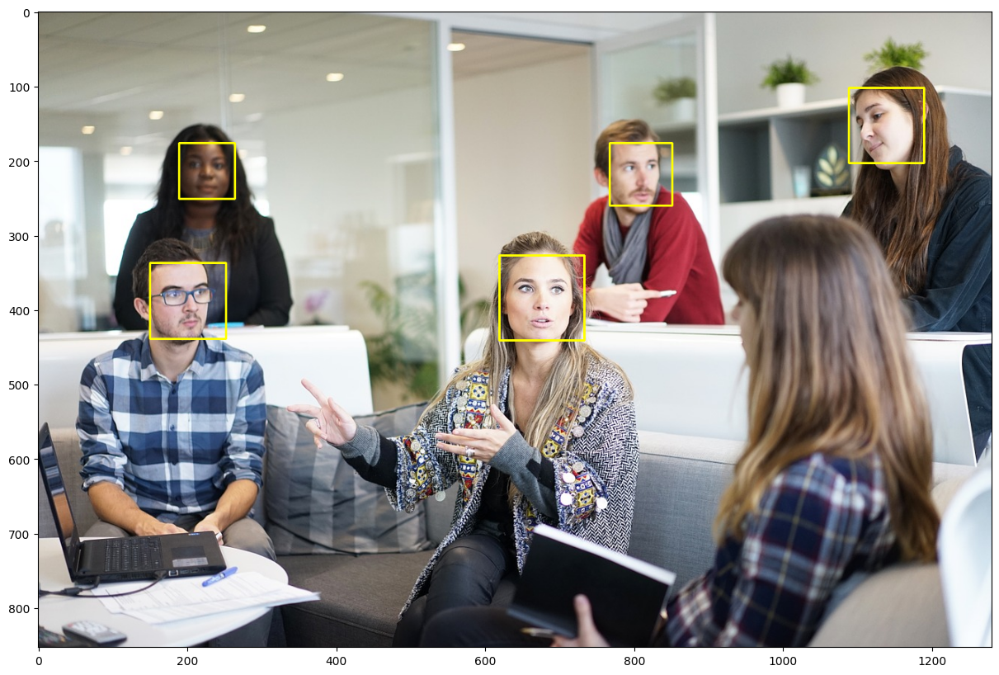

In [14]:
#desenha o retângulo na imagem
#(x,y) - ponto inicial
#(x+w, y+h) - tamanho
#(255, 255, 0 ) - cor do retângulo
#2 - espessura da linha do retângulo

for (x, y, w, h) in faces:
    cv2.rectangle(imagem_anotada, (x,y), (x+w, y+h), (255, 255, 0), 2)


plt.figure(figsize= (20,10))
plt.imshow(imagem_anotada)

In [15]:
face_imagem = 0
for (x, y, w, h) in faces:
    face_imagem +=1
    imagem_roi = imagem[y:y+h, x:x+w]
    imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
    cv2.imwrite("face_" + str(face_imagem)+".png", imagem_roi)

## Exercício

In [16]:
img_exercicio = ["imagens/exercicio_2_1.png",
                 "imagens/exercicio_2_2.png", 
                 "imagens/exercicio_2_3.png"]

In [17]:
classificador = cv2.CascadeClassifier("classificadores/haarcascade_frontalface_default.xml")

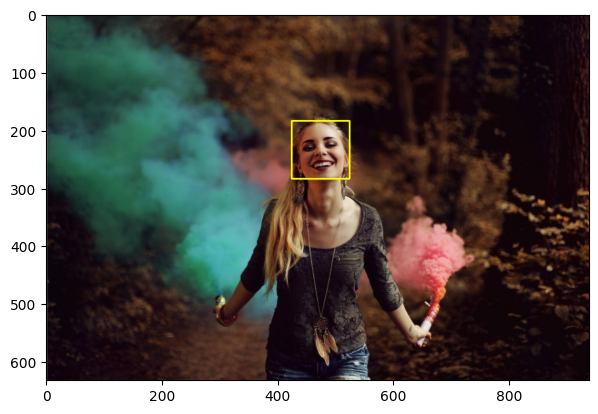

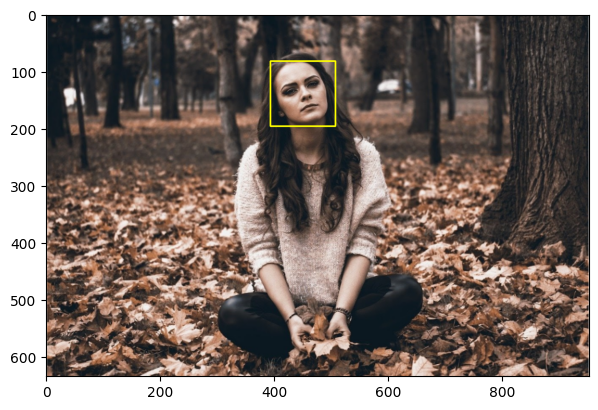

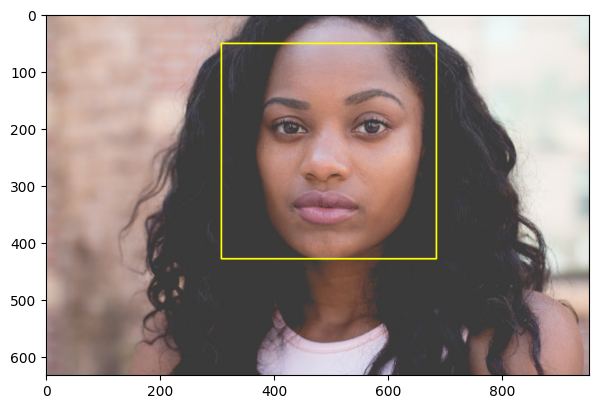

In [18]:
Img_index = 0
for imagg in img_exercicio:
    Img_index += 1
    img = cv2.imread(imagg)
    img_original = cv2.imread(imagg)
    #plt.imshow(img)
    #plt.show()
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    img_anotada = img.copy()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    faces_exercicio = classificador.detectMultiScale(img, 1.3,5)
    for (x, y, w, h) in faces_exercicio:
        cv2.rectangle(img_anotada, (x,y), (x+w, y+h), (255, 255, 0), 2)
        imagem_roi = img_anotada[y:y+h, x:x+w]
        imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
        cv2.imwrite("face_" + str(Img_index)+"_exercicio.png", imagem_roi)
    plt.figure(figsize= (7,7))
    plt.imshow(img_anotada)
    plt.show()

    

# 5. Criando um modelo de Reconhecimento

## 5.0 Libs

In [7]:
import cv2
#import matplotlib.pyplot as plt

from os import listdir, path, makedirs
from os.path import isfile, join

import shutil
import numpy as np

from sklearn.metrics import accuracy_score

In [8]:
#%pip install -U scikit-learn scipy matplotlib

In [9]:
#%pip uninstall opencv-python

In [10]:
#%pip install opencv-contrib-python  --user

## 5.1. Pré processamento das imagens

O primeiro passo é observar as imagens e fazer um tratamento prévio para depois criar o modelo de reconhecimento. Neste caso vamos trabalhar com imagens que já estão "recortadas" com apenas o rosto., por isso não vamos precisar usar um classificador (Haar Cascade) para poder identificar os rostos e recortar.

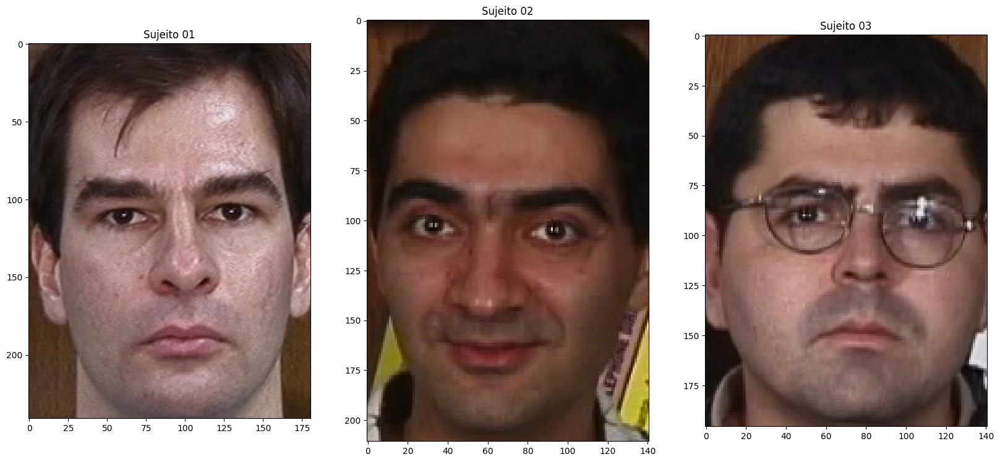

In [11]:
imagem_face_1 = cv2.imread("imagens/cropped_faces/s01_01.jpg")
imagem_face_1 = cv2.cvtColor(imagem_face_1, cv2.COLOR_BGR2RGB)

imagem_face_2 = cv2.imread("imagens/cropped_faces/s02_01.jpg")
imagem_face_2 = cv2.cvtColor(imagem_face_2, cv2.COLOR_BGR2RGB)

imagem_face_3 = cv2.imread("imagens/cropped_faces/s03_01.jpg")
imagem_face_3 = cv2.cvtColor(imagem_face_3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.subplot(131)
plt.title("Sujeito 01")
plt.imshow(imagem_face_1)

plt.subplot(132)
plt.title("Sujeito 02")
plt.imshow(imagem_face_2)

plt.subplot(133)
plt.title("Sujeito 03")
plt.imshow(imagem_face_3)

plt.show()


In [12]:
imagem_face_1.shape

(241, 181, 3)

In [13]:
imagem_face_2.shape

(211, 141, 3)

In [14]:
imagem_face_3.shape

(196, 141, 3)

Como as imagens possuem tamanhos diferentes é preciso normalizar elas (deixar do mesmo tamanho). Também vamos separar as imagens entre treino e teste. 

Como há 15 imagens de cada sujeito, 10 serão para treino e 5 para teste do modelo

In [15]:
faces_caminho = "imagens/cropped_faces/"

lista_arq_faces = [f for f in listdir(faces_caminho) if isfile(join(faces_caminho, f))]

In [16]:
lista_arq_faces[0]

's01_01.jpg'

In [17]:
len(lista_arq_faces)

750

In [18]:
#verificar se os diretórios já existem e se já tem as imagens

faces_path_treino = "imagens/treino/"
faces_path_teste = "imagens/teste/"
lista_arq_treino = [f for f in listdir(faces_path_treino) if isfile(join(faces_caminho, f))]
lista_arq_teste = [f for f in listdir(faces_path_teste) if isfile(join(faces_caminho, f))]


if not path.exists(faces_path_treino):
    makedirs(faces_path_treino)

if not path.exists(faces_path_teste):
    makedirs(faces_path_teste)

if len(lista_arq_treino) == 0 and len(lista_arq_teste) == 0:
    for arq in lista_arq_faces:
        sujeito = arq[1:3]      #corta a string para identificar o número do sujeito
        numero = arq[4:6]       #corta a string para identificar o número da imagem

        if int(numero) <= 10:
            shutil.copyfile(faces_caminho + arq, faces_path_treino + arq)
        else:
            shutil.copyfile(faces_caminho + arq, faces_path_teste + arq)

Padronizando o tamanho e o espaço de cores para escala de cinza - para os classificadores

In [19]:
 #interpolation - usado para poder "completar" a imagem 
 # cv2.INTER_LANCZOS4 - algoritmo mais demorado porém + preciso

def padronizar_imagem(imagem_caminho):
    imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE)
    imagem = cv2.resize(imagem, (200, 200), interpolation = cv2.INTER_LANCZOS4) 
    return imagem


In [20]:
lista_faces_treino = [f for f in listdir(faces_path_treino) if isfile(join(faces_path_treino, f))]
lista_faces_teste = [f for f in listdir(faces_path_teste) if isfile(join(faces_path_teste, f))]

In [21]:
lista_faces_teste[0]

's01_11.jpg'

In [22]:
lista_faces_treino[0]

's01_01.jpg'

In [23]:
dados_treinamento, sujeitos = [], []
dados_teste, sujeitos_teste = [], []

In [24]:
def MontarLista_TreinamentoTeste(listafaces, dados, pessoas, caminho):
    for i, arq in enumerate(listafaces):
        imagem_path = caminho + arq
        imagem = padronizar_imagem(imagem_path)
        dados.append(imagem)
        sujeito = arq[1:3]
        pessoas.append(int(sujeito))

In [25]:
MontarLista_TreinamentoTeste(lista_faces_treino, dados_treinamento, sujeitos, faces_path_treino)
MontarLista_TreinamentoTeste(lista_faces_teste, dados_teste, sujeitos_teste, faces_path_teste)

In [26]:
len(dados_treinamento)

500

In [27]:
len(sujeitos)

500

In [28]:
len(dados_teste)

250

In [29]:
len(sujeitos_teste)

250

Text(0.5, 1.0, '1')

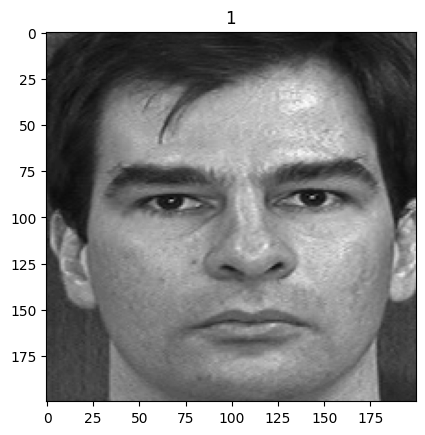

In [30]:
plt.imshow(dados_treinamento[0], cmap="gray")
plt.title(sujeitos[0])

Text(0.5, 1.0, '1')

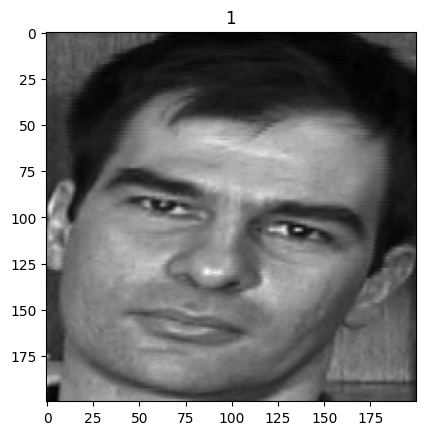

In [31]:
plt.imshow(dados_teste[0], cmap="gray")
plt.title(sujeitos_teste[0])

## desafio

Padronizar o tamanho das imagens face_1_exercicio.png, face_2_exercicio.png e face_3_exercicio.png. Depois criar um arquivo com as imagens padronizadas

In [30]:
import numpy as np

In [31]:
roi_1 = cv2.imread("face_1_exercicio.png")
roi_1 = cv2.cvtColor(roi_1, cv2.COLOR_BGR2RGB)

roi_2 = cv2.imread("face_2_exercicio.png")
roi_2 = cv2.cvtColor(roi_2, cv2.COLOR_BGR2RGB)

roi_3 = cv2.imread("face_3_exercicio.png")
roi_3 = cv2.cvtColor(roi_3, cv2.COLOR_BGR2RGB)

In [32]:
roi_1.shape

(100, 100, 3)

In [33]:
roi_2.shape

(114, 114, 3)

In [34]:
roi_3.shape

(377, 377, 3)

In [35]:
mediana_altura = np.median([roi_1.shape[0], roi_2.shape[0], roi_3.shape[0]])
print(mediana_altura)

mediana_comprimento = np.median([roi_1.shape[1], roi_2.shape[1], roi_3.shape[1]])
print(mediana_comprimento)

114.0
114.0


In [36]:
rosto_1 = cv2.resize(roi_1, (int(mediana_altura), int(mediana_comprimento)), interpolation=cv2.INTER_LANCZOS4)
rosto_2 = cv2.resize(roi_2, (int(mediana_altura), int(mediana_comprimento)), interpolation=cv2.INTER_LANCZOS4)
rosto_3 = cv2.resize(roi_3, (int(mediana_altura), int(mediana_comprimento)), interpolation=cv2.INTER_LANCZOS4)

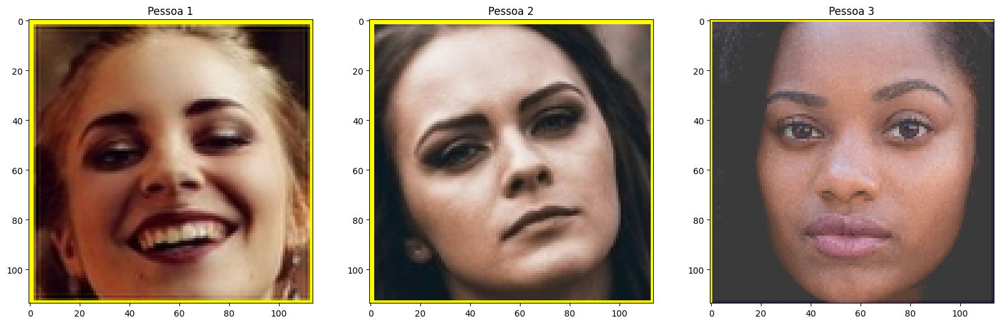

In [37]:
plt.figure(figsize=(20,10))

plt.subplot(131)
plt.title("Pessoa 1")
plt.imshow(rosto_1)

plt.subplot(132)
plt.title("Pessoa 2")
plt.imshow(rosto_2)

plt.subplot(133)
plt.title("Pessoa 3")
plt.imshow(rosto_3)

plt.show()

In [38]:
rosto_1_bgr = cv2.cvtColor(rosto_1, cv2.COLOR_RGB2BGR)
rosto_2_bgr = cv2.cvtColor(rosto_2, cv2.COLOR_RGB2BGR)
rosto_3_bgr = cv2.cvtColor(rosto_3, cv2.COLOR_RGB2BGR)

cv2.imwrite("desafio_face_1.png", rosto_1_bgr)
cv2.imwrite("desafio_face_2.png", rosto_2_bgr)
cv2.imwrite("desafio_face_3.png", rosto_3_bgr)

True

## 5.2 Modelos

### Eingenfaces

Para trabalhar com o modelo de EngineFaces é necessário converter a lista de sujeitos para um array 32bits

In [32]:
sujeitos = np.asarray(sujeitos, dtype = np.int32) 
sujeitos_teste = np.asarray(sujeitos_teste, dtype = np.int32)

In [33]:
modelos_eigenfaces = cv2.face.EigenFaceRecognizer_create()

In [34]:
modelos_eigenfaces.train(dados_treinamento, sujeitos)

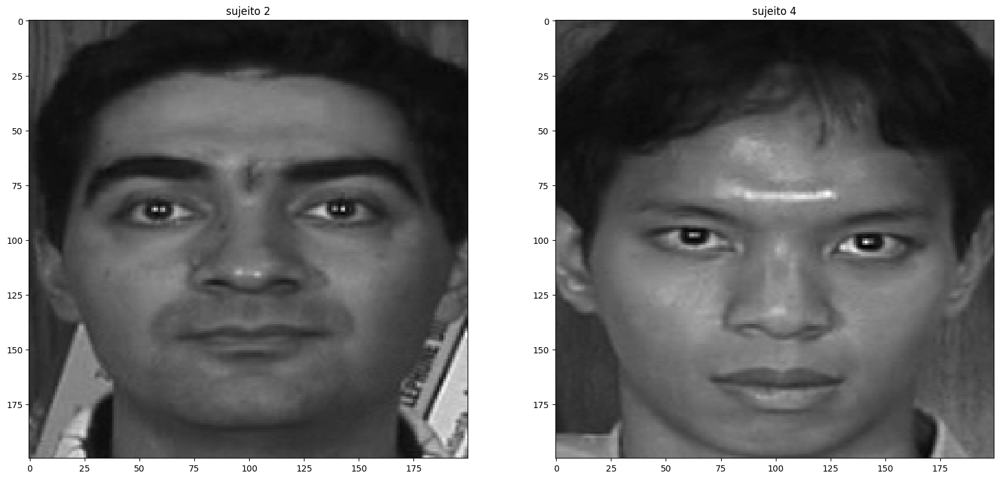

In [35]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("sujeito " + str(sujeitos_teste[7]))
plt.imshow(dados_teste[7], cmap="gray")

plt.subplot(122)
plt.title("sujeito " + str(sujeitos_teste[16]))
plt.imshow(dados_teste[16], cmap="gray")

plt.show()

In [36]:
predicao = modelos_eigenfaces.predict(dados_teste[7])
predicao

(2, 3820.568961327711)

In [37]:
predicao_2 = modelos_eigenfaces.predict(dados_teste[16])
predicao_2

(4, 2205.1683583580334)

### Fisherfaces

 O FisherFaces foi feito de uma forma que consegue maximizar não os componentes e informações dentro da própria classe, mas sim de extra classe, ou seja, ele quer maximizar diferentes classes para que fique fácil o classificador entender se é a pessoa A, B ou C.

 
 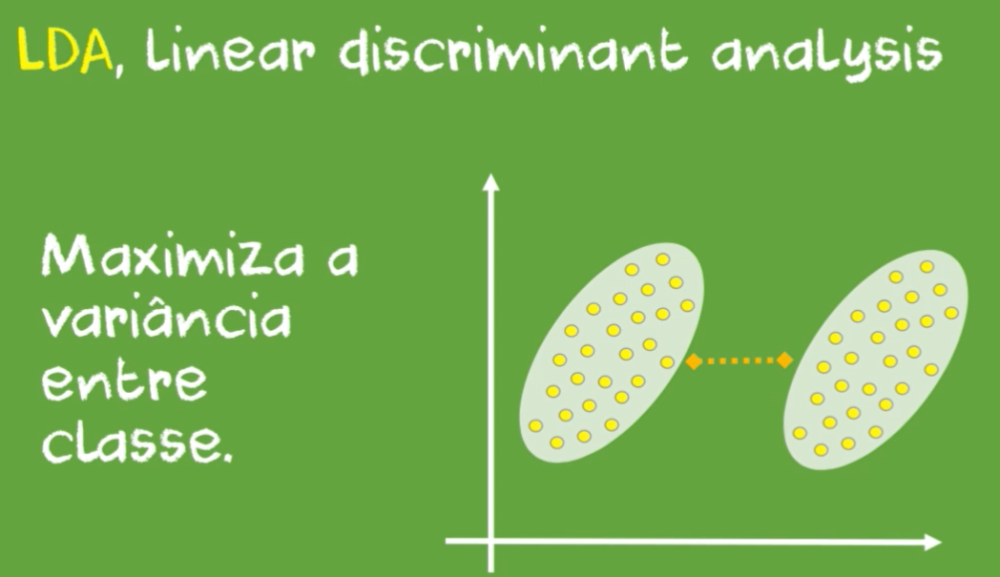

In [38]:
modelo_fisherfaces = cv2.face.FisherFaceRecognizer_create()

In [39]:
modelo_fisherfaces.train(dados_treinamento, sujeitos)

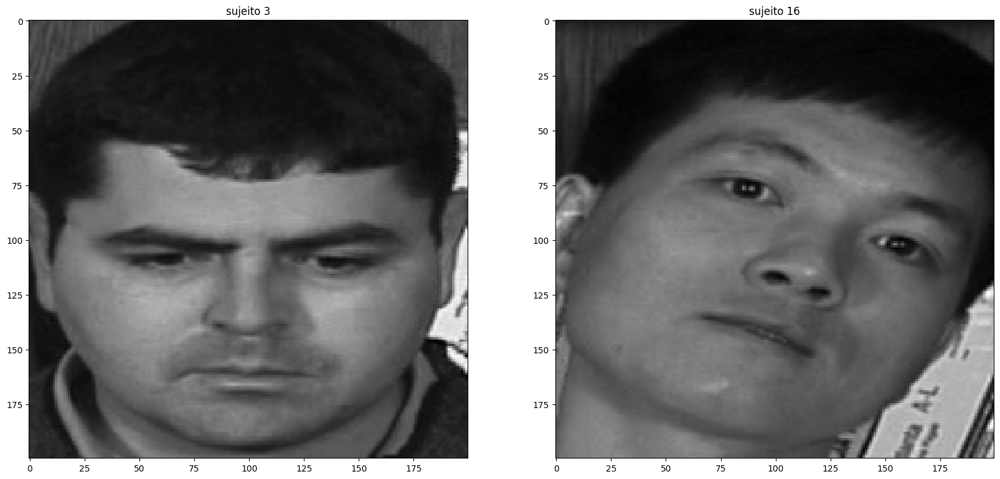

In [40]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("sujeito " + str(sujeitos_teste[13]))
plt.imshow(dados_teste[13], cmap="gray")

plt.subplot(122)
plt.title("sujeito " + str(sujeitos_teste[79]))
plt.imshow(dados_teste[79], cmap="gray")

plt.show()

In [41]:
predicao_fisher = modelo_fisherfaces.predict(dados_teste[13])
predicao_fisher

(3, 891.0556911562242)

In [42]:
predicao_fisher_2 = modelo_fisherfaces.predict(dados_teste[79])
predicao_fisher_2

(32, 1105.049672208084)

### LBPH

O algoritmo “LBPH” é considerado um dos mais robustos quando comparamos com o Eigenfaces e até com o FisherFaces. Ele é robusto porque durante a construção dele, tem umas operações de filtro que atenuam bastante os efeitos de iluminação e algum tipo de ruído, que possa influenciar tanto o Eigenfaces, quanto o FisherFaces, então, dependendo do tipo de imagem que você tem, o “LBPH” pode se comportar um pouco melhor.

Ele faz basicamente um filtro para você comparar que pixel central com os demais, automaticamente ele já está suavizando essa imagens. Quando suavizamos essa imagem, ele (modelo) fica mais tolerante em relação a problemas de luminosidade.

Porque basicamente será compensadp esse efeito de luz na imagem inteira e vai diminuir esse efeito, então por isso ele consegue ser um pouco mais robusto que os demais.

E depois, para podermos comparar uma imagem de inferência com a imagem que foi treinada, também usamos a distância de similaridade, só que cada algoritmo tem uma distância própria. É de acordo com cada algoritmo.

Então no caso do “LBPH”, ele não é tão grande quanto os dos planos faciais de Eigenfaces e FisherFaces, então se você determinar uma distância para o “LBPH”, só pode usar com ele. A mesma coisa: se você determinar a distância para o Eigenfaces, só pode usar com ele e assim por diante.

In [43]:
modelo_lbph = cv2.face.LBPHFaceRecognizer_create()

In [44]:
modelo_lbph.train(dados_treinamento, sujeitos)

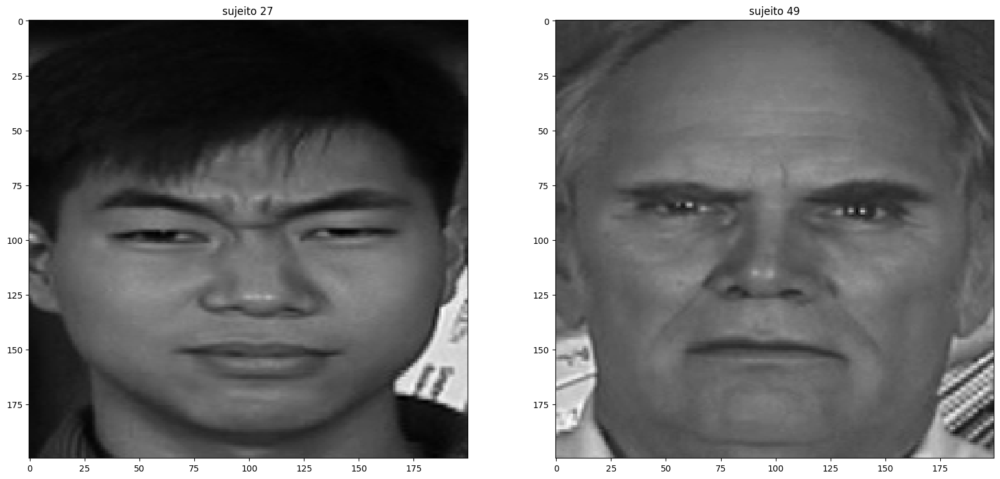

In [45]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("sujeito " + str(sujeitos_teste[133]))
plt.imshow(dados_teste[133], cmap="gray")

plt.subplot(122)
plt.title("sujeito " + str(sujeitos_teste[240]))
plt.imshow(dados_teste[240], cmap="gray")

plt.show()

In [46]:
predicao_lbph = modelo_lbph.predict(dados_teste[133])
predicao_lbph

(27, 32.0659774523926)

In [47]:
predicao_lbph_2 = modelo_lbph.predict(dados_teste[240])
predicao_lbph_2

(49, 37.485627785295456)

## 5.3 Acurácia

In [48]:
y_pred_eingenfaces = []
y_pred_fisherfaces = []
y_pred_lbph = []

In [49]:
for item in dados_teste:
    y_pred_eingenfaces.append(modelos_eigenfaces.predict(item)[0])
    y_pred_fisherfaces.append(modelo_fisherfaces.predict(item)[0])
    y_pred_lbph.append(modelo_lbph.predict(item)[0])


In [50]:
acuracia_eingenfaces = accuracy_score(sujeitos_teste, y_pred_eingenfaces)
acuracia_fisherfaces = accuracy_score(sujeitos_teste, y_pred_fisherfaces)
acuracia_lbph = accuracy_score(sujeitos_teste, y_pred_lbph)


In [51]:
print(f"Acurácia eingenfaces: {acuracia_eingenfaces}")

print(f"Acurácia fisherfaces: {acuracia_fisherfaces}")

print(f"Acurácia lbph: {acuracia_lbph}")


Acurácia eingenfaces: 0.724
Acurácia fisherfaces: 0.52
Acurácia lbph: 0.792


## Desafio - Capturando imagens direto da câmera do laptop

In [11]:
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

def padronizar_imagem(imagem):
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem = cv2.resize(imagem, (400,300))
    return imagem

def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)

In [12]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


In [26]:
# Capturando as imagens para treinamento

captura_video = cv2.VideoCapture(0)

classificador_face = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

contador = 0

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            frame_gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

            faces = classificador_face.detectMultiScale(frame_gray, 1.3, 5)

            if len(faces) > 0:
                contador += 1
                if contador <= 100:
                    for (x,y,w,h) in faces:
                        roi = frame_gray[y:y+h, x:x+w]
                        cv2.resize(roi, (200, 200), interpolation=cv2.INTER_LANCZOS4)
                        cv2.imwrite("imagens/yasmin/" + str(contador) + ".png", roi)
                        cv2.putText(frame, "Coletado " + str(contador) + " faces", (20,20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
                else:
                    cv2.putText(frame, "ConcluIdo", (20,20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


In [27]:
# Preparando os dados de treinamento 

faces_caminho_treinamento = "imagens/yasmin/"
lista_faces_treinamento = [f for f in listdir(faces_caminho_treinamento) if isfile(join(faces_caminho_treinamento, f))]

In [28]:
# Separando os dados do sujeito

dados_treinamento, sujeitos = [], []

for i, arquivo in enumerate(lista_faces_treinamento):
    imagem_caminho = faces_caminho_treinamento + arquivo
    imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE)
    dados_treinamento.append(imagem)
    sujeitos.append(0)

sujeitos = np.asarray(sujeitos, dtype=np.int32)

In [29]:
# Treinando o modelo

model_lbph = cv2.face.LBPHFaceRecognizer_create()
model_lbph.train(dados_treinamento, sujeitos)

In [30]:
# Realizando a captura e validação em tempo real

captura_video = cv2.VideoCapture(0)

classificador_face = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

contador = 0

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            frame_gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
            faces = classificador_face.detectMultiScale(frame_gray, 1.3, 5)

            if len(faces) > 0:
                for (x,y,w,h) in faces:
                    roi = frame_gray[y:y+h, x:x+w]
                    roi = cv2.resize(roi, (200, 200), interpolation=cv2.INTER_LANCZOS4)
                    predicao = model_lbph.predict(roi)
                    cv2.putText(frame, "Similaridade " + str(predicao[1]), (x,y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


# 6. Análise dos marcos faciais

http://dlib.net/

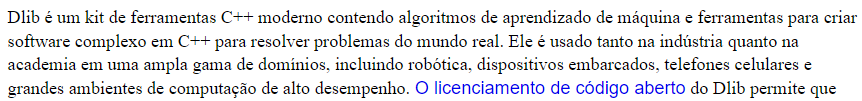

## 6.0 Libs 

In [35]:
import numpy as np
import matplotlib.pyplot as plt

from scipy.spatial import distance as dist  # usado para trabalhar com a distância euclidiana dos pontos

## 6.1 Identificando os rostos com dlib

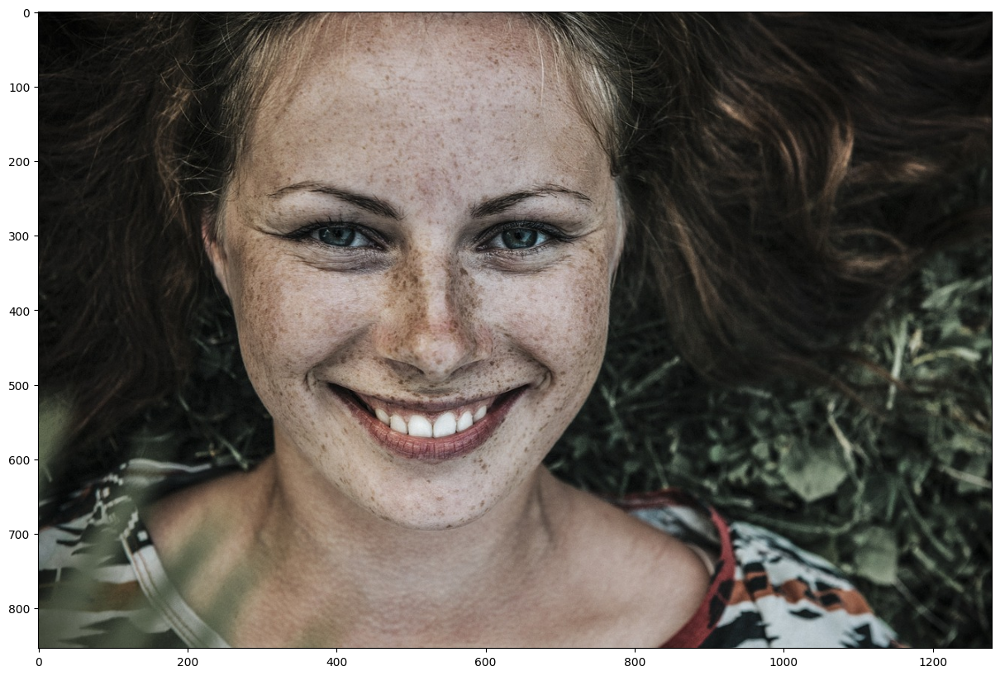

In [15]:
imagem = cv2.imread("imagens/px-woman-smilings.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem)

In [16]:
# Definindo o padrão de classificação/predição - 5 pontos ou 68 pontos

classificador_dlib_68 = "classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68)
detector_face = dlib.get_frontal_face_detector() #função para detectar rostos na imagem

In [18]:
# Função para anotar o rosto e criar um retângulo

def anotar_rosto(img):
    retangulos = detector_face(img, 1)

    if len(retangulos) == 0:
        return None
    
    for k, d in enumerate(retangulos):
        print("Identificado rosto " + str(k+1))  #k+1 porque é baseado em 0
        cv2.rectangle(img, ((d.left(), d.top())),(d.right(), d.bottom()),(255, 255, 0), 2)
    
    return img

Identificado rosto 1


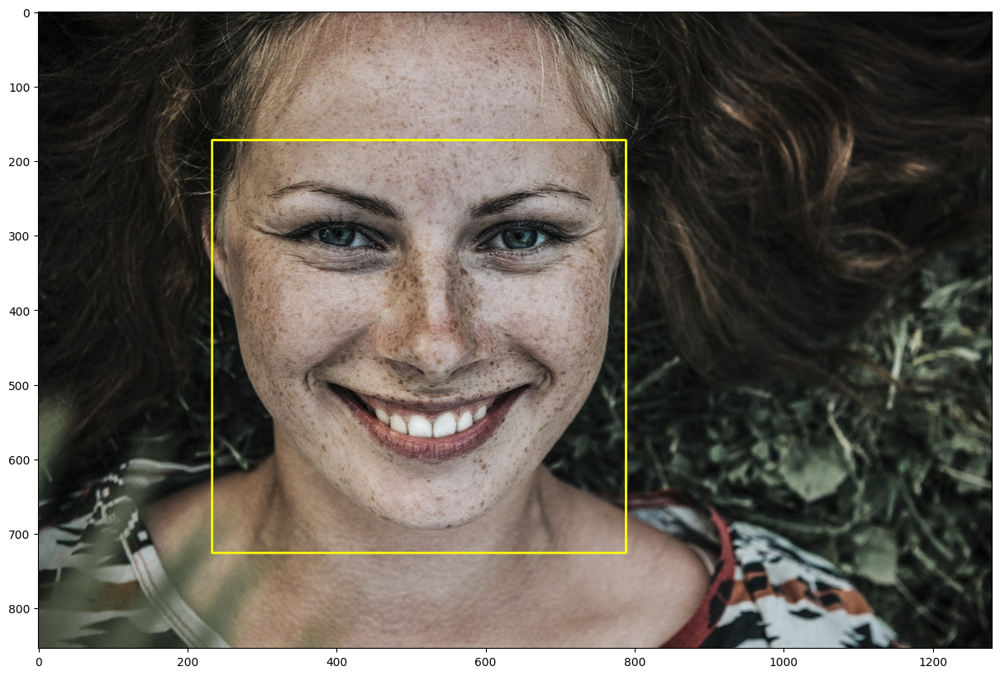

In [20]:
# Criar uma cópia da imagem original, identificar o rosto e desenha o retângulo e plotar imagem final 

imagem_copia = imagem.copy()
imagem_copia = anotar_rosto(imagem_copia)

plt.figure(figsize=(20,10))
plt.imshow(imagem_copia)

## 6.2 Extraindo os marcos

O algoritmo do dlib trabalha a partir de pontos criados nos rostos, pondendo ser 5 ou 68 pontos. 

 **Relação para a classificação de 68 pontos:**

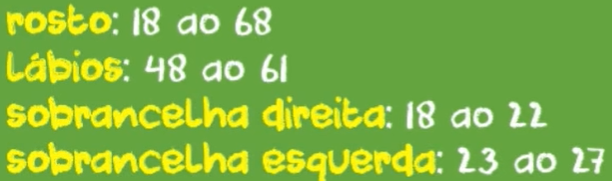
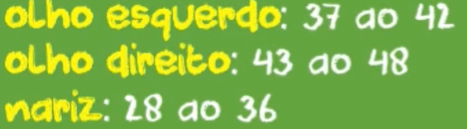

In [22]:
#Função para identificar os marcos faciais

def identificar_marcos(img):
    retangulos = detector_face(img, 1)

    if len(retangulos) == 0:
        return None
    
    marcos = []

    for ret in retangulos:
       marcos.append( np.matrix([[p.x, p.y] for p in classificador_dlib(img, ret).parts()]) )     # pega os pontos de x,y dos pontos identificados no rosto. | Append -> para se tiver rosto > 1

    return marcos

In [23]:
marcos_faciais = identificar_marcos(imagem)

In [26]:
# Verificando os rostos identificados nos marcos e a quantidade de pontos

a =  len(marcos_faciais)
b = len(marcos_faciais[0])

print("Quantidade de rostos: " + str(a))
print("Quantidade de pontos: " + str(b))

Quantidade de rostos: 1
Quantidade de pontos: 68


In [30]:
# Desenhar os pontos dos marcos na imagem

def desenhar_marcos(img, marcos):

    for marco in marcos:
        for indice, ponto in enumerate(marco):
            centro = (ponto[0,0], ponto[0,1])
            cv2.circle(img, centro, 3, (255, 255, 0), -1)
            cv2.putText(img, str(indice), centro, cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255),2)

    return img

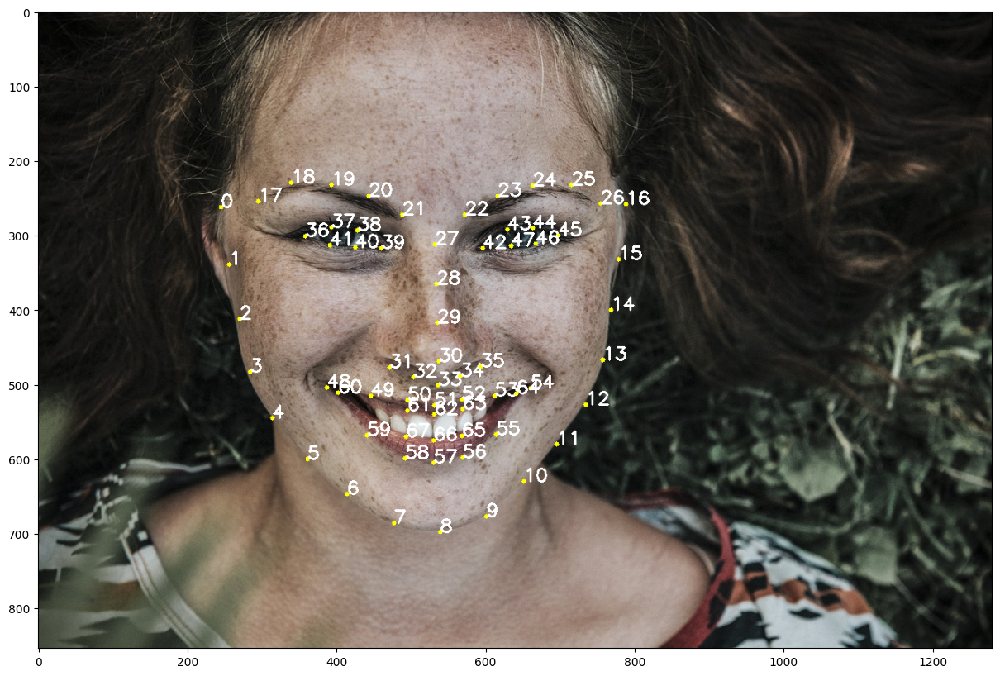

In [31]:
# Criar uma cópia da imagem, identifica os marcos na imagem e depois plota a imagem final com os pontos identificados

imagem_copia = imagem.copy()
marcos = []

marcos = identificar_marcos(imagem_copia)
imagem_copia = desenhar_marcos(imagem_copia, marcos)

plt.figure(figsize=(20,10))
plt.imshow(imagem_copia)

Testando com outra imagem

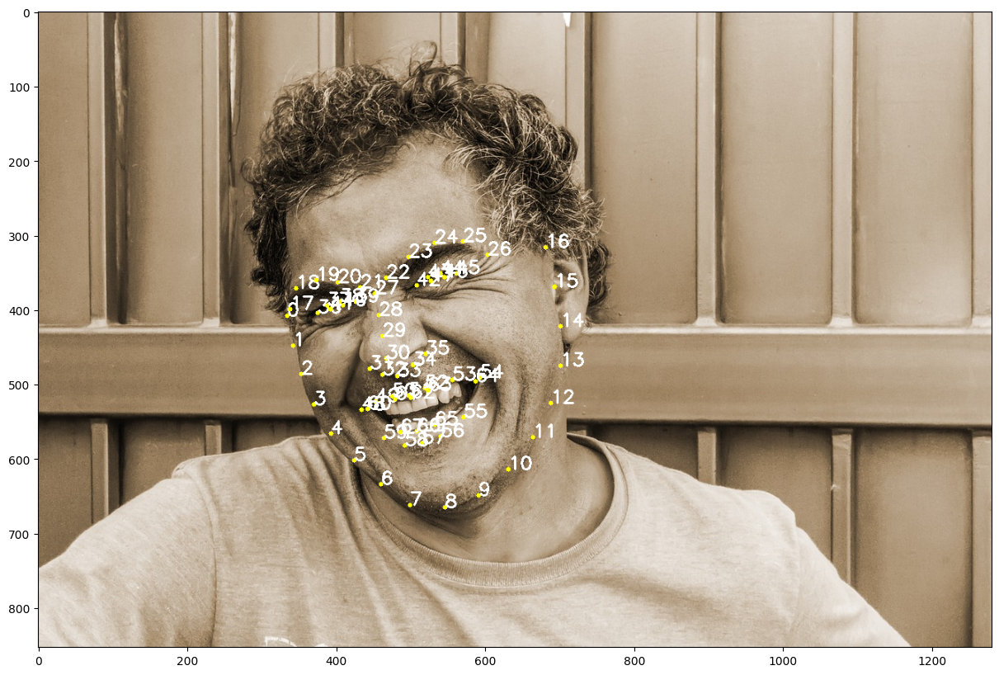

In [48]:
imagem_2 = cv2.imread("imagens/px-man-happy.jpg")
imagem_2 = cv2.cvtColor(imagem_2, cv2.COLOR_BGR2RGB)

imagem_copia_2 = imagem_2.copy()
marcos_2 = []

marcos_2 = identificar_marcos(imagem_copia_2)
imagem_copia_2 = desenhar_marcos(imagem_copia_2, marcos_2)

plt.figure(figsize=(20,10))
plt.imshow(imagem_copia_2)

## 6.3 Trabalhando com a questão de zoom in e zoom out

### Dados

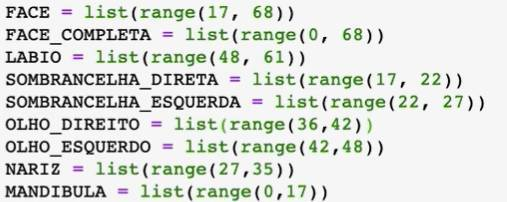

chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://vision.fe.uni-lj.si/cvww2016/proceedings/papers/05.pdf

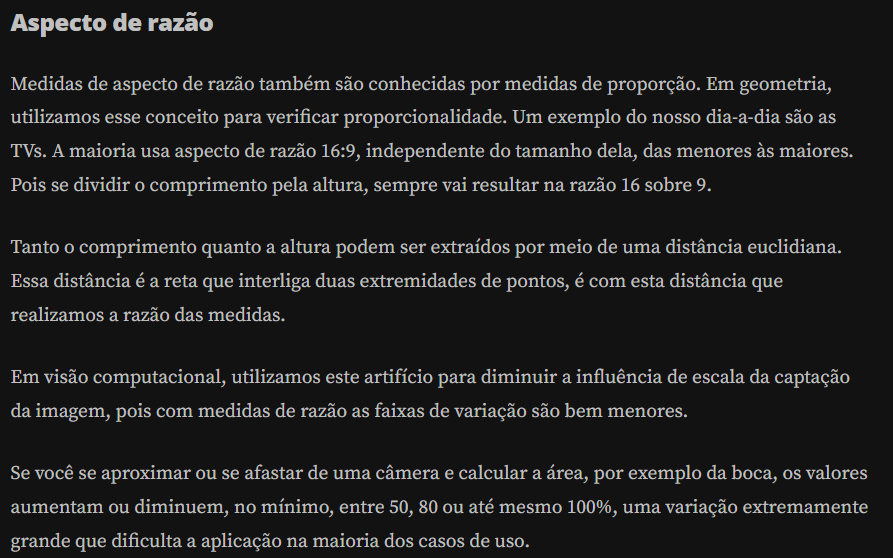

**EYE ASPECT RATIO - EAR --> ASPECTO RAZÃO OLHOS**

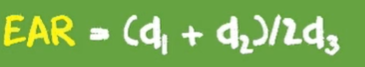

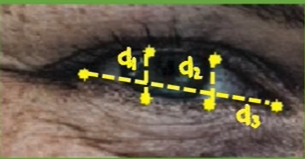

**MOUTH ASPECT RATIO - MAR --> ASPECTO RAZÃO BOCA**

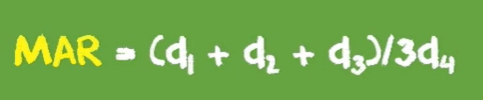

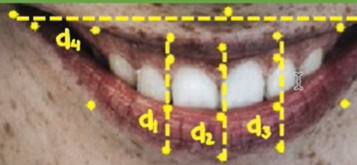


### 1. Vamos comparar o aspecto de razão de uma pessoa séria com uma pessoa sorrindo

In [66]:
# Criando a lista de pontos do rosto 

FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
SOBRANCELHA_DIREITA = list(range(17, 22))
SOBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36, 42))
OLHO_ESQUERDO = list(range(42, 48))
NARIZ = list(range(27, 35))
MANDIBULA = list(range(0, 17))


In [102]:
# Função para criar o aspecto de razão para os olhos

def razao_olhos(pontos_olhos):
    
    a = dist.euclidean(np.ravel(pontos_olhos[1]), np.ravel(pontos_olhos[5]))        #np.ravel() -> tranforma/força o vetor em unidimensional -> necessário para calcular a distância
    b = dist.euclidean(np.ravel(pontos_olhos[2]),  np.ravel(pontos_olhos[4]))
    c = dist.euclidean(np.ravel(pontos_olhos[0]),  np.ravel(pontos_olhos[3]))

    aspecto_razao = (a + b)/(2.0 * c)

    return aspecto_razao

In [68]:
# Função para anotar marcos criando uma linha contínua entre eles

def anotar_marcos_olhos(img, marcos):
    retangulos = detector_face(img)

    if len(retangulos) == 0:
        return None
    
    for i, ret in enumerate(retangulos):
        marco = marcos[i]
        
        pontos = cv2.convexHull(marco[OLHO_ESQUERDO])
        cv2.drawContours(img, [pontos], 0, (0, 255, 0), 2)

        pontos = cv2.convexHull(marco[OLHO_DIREITO])
        cv2.drawContours(img, [pontos], 0, (0, 255, 0), 2)

    return img

#### Pessoa sorrindo

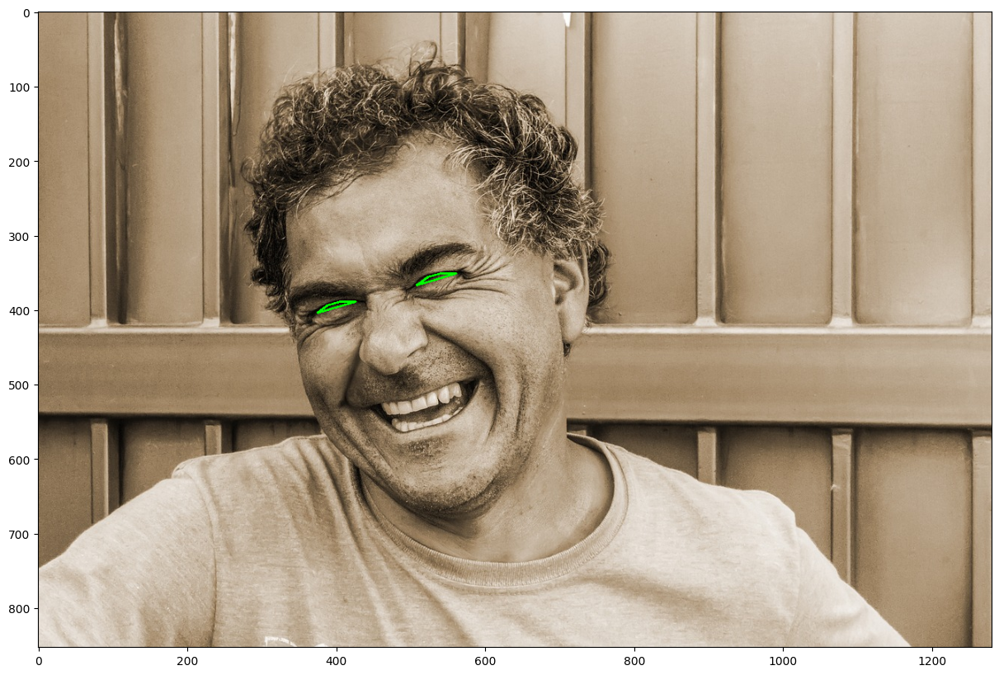

In [105]:
imagem_base = cv2.imread("imagens/px-man-happy.jpg")
imagem_base = cv2.cvtColor(imagem_base, cv2.COLOR_BGR2RGB)

imagem_sorrindo = imagem_base.copy()
marcos_sorrindo = []

marcos_sorrindo = identificar_marcos(imagem_sorrindo)
imagem_sorrindo = anotar_marcos_olhos(imagem_sorrindo, marcos_sorrindo)

plt.figure(figsize=(20,10))
plt.imshow(imagem_sorrindo)

In [106]:
razao_olho_esquerdo_2 = razao_olhos(marcos_sorrindo[0][OLHO_ESQUERDO])
razao_olho_direito_2 = razao_olhos(marcos_sorrindo[0][OLHO_DIREITO])

print("Razão olho esquero: " + str(razao_olho_esquerdo_2))
print("Razão olho direito: " + str(razao_olho_direito_2))

Razão olho esquero: 0.12169073046467273
Razão olho direito: 0.12044973520917499


#### Pessoa Seria

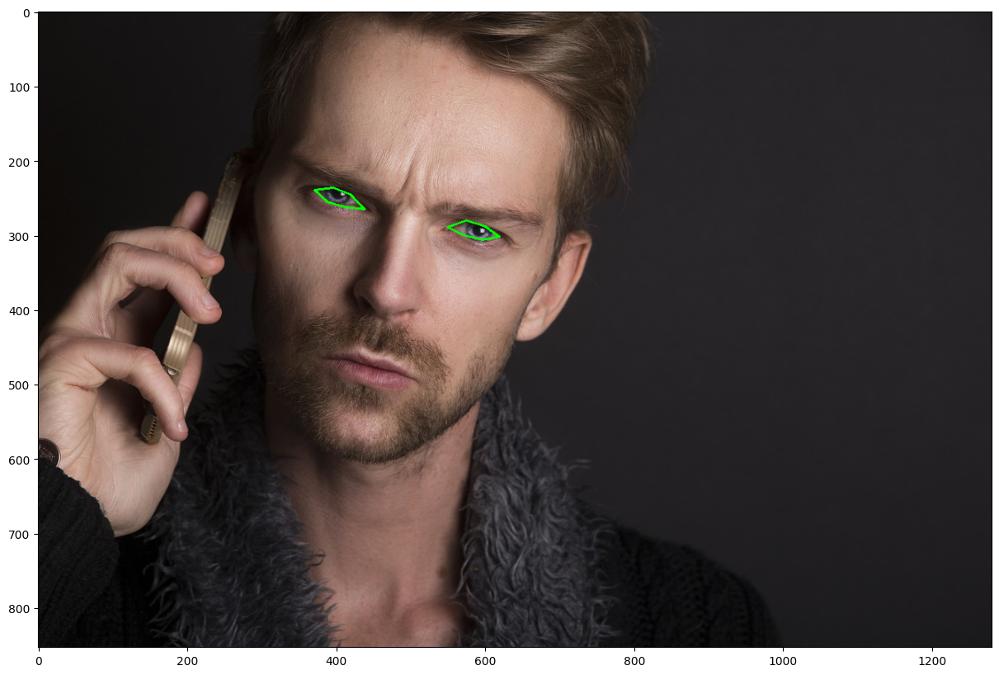

In [107]:
imagem_base = cv2.imread("imagens/px-man-serious.jpg")
imagem_base = cv2.cvtColor(imagem_base, cv2.COLOR_BGR2RGB)

imagem_serio = imagem_base.copy()
marcos_serio = []

marcos_serio = identificar_marcos(imagem_serio)
imagem_serio = anotar_marcos_olhos(imagem_serio, marcos_serio)

plt.figure(figsize=(20,10))
plt.imshow(imagem_serio)

In [108]:
razao_olho_esquerdo_3 = razao_olhos(marcos_serio[0][OLHO_ESQUERDO])
razao_olho_direito_3 = razao_olhos(marcos_serio[0][OLHO_DIREITO])

print("Razão olho esquero: " + str(razao_olho_esquerdo_3))
print("Razão olho direito: " + str(razao_olho_direito_3))

Razão olho esquero: 0.2715204726310253
Razão olho direito: 0.27133313866169434


## Desafio - desenhar um retângulo ao redor da boca quando ela estiver aberta - capturando vídeo em tempo real

In [151]:
# Libs
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

# Função para padronizar a imagem e exibir o vídeo

def padronizar_imagem(imagem):
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem = cv2.resize(imagem, (800,600))
    return imagem

def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True) #refresh

In [152]:
classificador_dlib_68_pontos = "classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_pontos)
detector_face = dlib.get_frontal_face_detector()

In [153]:
def pontos_marcos_faciais(imagem):
    retangulos = detector_face(imagem, 1)

    if len(retangulos) == 0:
        return None

    marcos = []

    for retangulo in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem, retangulo).parts()]))

    return marcos

In [154]:
def anotar_marcos_faciais(imagem, marcos_faciais):
    if imagem is None:
        return None

    for marco in marcos_faciais:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0, 0], ponto[0, 1])
            cv2.circle(imagem, centro, 3, color=(255, 255, 0), thickness=-1)
    return imagem

In [155]:
FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
LABIO = list(range(48, 61))
SOMBRANCELHA_DIREITA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36, 42))
OLHO_ESQUERDO = list(range(42, 48))
NARIZ = list(range(27, 35))
MANDIBULA = list(range(0, 17))

In [156]:
def aspecto_razao_boca(pontos_boca):
    a = dist.euclidean(np.ravel(pontos_boca[3]), np.ravel(pontos_boca[9]))
    b = dist.euclidean(np.ravel(pontos_boca[2]), np.ravel(pontos_boca[10]))
    c = dist.euclidean(np.ravel(pontos_boca[4]), np.ravel(pontos_boca[8]))
    d = dist.euclidean(np.ravel(pontos_boca[0]), np.ravel(pontos_boca[6]))
    aspecto_razao = (a + b + c)/(3.0 * d)
    return aspecto_razao

In [161]:
def anotar_marcos_boca(img, marcos):
    retangulos = detector_face(img)

    if len(retangulos) == 0:
        return img
    
    for i, ret in enumerate(retangulos):
        marco = marcos[i]
        
        pontos = cv2.convexHull(marco[LABIO])
        cv2.drawContours(img, [pontos], 0, (0, 255, 0), 2)
        
    return img

In [166]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            pontos = pontos_marcos_faciais(frame)
            if pontos is not None:
                frame = anotar_marcos_faciais(frame, pontos)
                frame = anotar_marcos_boca(frame, pontos)
                pontos = pontos[0]
                ar = aspecto_razao_boca(pontos[LABIO])
                ar = round(ar,3)

                if ar > 0.5:
                    (x, y, w, h) = cv2.boundingRect(pontos[LABIO])
                    frame = cv2.rectangle(frame, (x,y), (x+w,y+h), (255,255,0), 2)

                coord = tuple(pontos[LABIO][0].A1.reshape(1, -1)[0])
                coord = (coord[0], coord[1] + 40)
                cv2.putText(frame, "Aspecto Razao " + str(ar), coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


## Desafio - Avaliando a quantidade de bocejos

In [173]:
# Libs
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

# Detector de faces
classificador_dlib_68_pontos = "classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_pontos)
detector_face = dlib.get_frontal_face_detector()

# Pontos de interesse
FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
LABIO = list(range(48, 61))
SOMBRANCELHA_DIREITA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36, 42))
OLHO_ESQUERDO = list(range(42, 48))
NARIZ = list(range(27, 35))
MANDIBULA = list(range(0, 17))

In [179]:
# Função para padronizar a imagem
def padronizar_imagem(imagem):
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem = cv2.resize(imagem, (800,600))
    return imagem

# Função para exibir o vídeo
def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True) #refresh

# Função para identificar os marcos faciais
def pontos_marcos_faciais(imagem):
    retangulos = detector_face(imagem, 1)

    if len(retangulos) == 0:
        return imagem

    marcos = []

    for retangulo in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem, retangulo).parts()]))

    return marcos

# Função para plotar os marcos faciais
def anotar_marcos_faciais(imagem, marcos_faciais):
    if imagem is None:
        return None

    for marco in marcos_faciais:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0, 0], ponto[0, 1])
            cv2.circle(imagem, centro, 3, color=(255, 255, 0), thickness=-1)
    return imagem

# Função para calcular o aspecto razão
def aspecto_razao_boca(pontos_boca):
    a = dist.euclidean(np.ravel(pontos_boca[3]), np.ravel(pontos_boca[9]))
    b = dist.euclidean(np.ravel(pontos_boca[2]), np.ravel(pontos_boca[10]))
    c = dist.euclidean(np.ravel(pontos_boca[4]), np.ravel(pontos_boca[8]))
    d = dist.euclidean(np.ravel(pontos_boca[0]), np.ravel(pontos_boca[6]))
    aspecto_razao = (a + b + c)/(3.0 * d)
    return aspecto_razao

# Função para plotar o desenho da boca
def anotar_marcos_boca(img, marcos):
    retangulos = detector_face(img)

    if len(retangulos) == 0:
        return img
    
    for i, ret in enumerate(retangulos):
        marco = marcos[i]
        
        pontos = cv2.convexHull(marco[LABIO])
        cv2.drawContours(img, [pontos], 0, (0, 255, 0), 2)
        
    return img

# Captura o vídeo
captura_video = cv2.VideoCapture(0)#"videos/bocejo.mov")

# Plotar o vídeo 
try:
    aspecto_razao_max = 0
    qtde_bocejo = 0

    bocejo = False
    bocejo_anterior = False

    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            pontos = pontos_marcos_faciais(frame)

            if pontos is not None:
                #frame = anotar_marcos_faciais(frame, pontos)
                frame = anotar_marcos_boca(frame, pontos)
                pontos = pontos[0]
                ar = aspecto_razao_boca(pontos[LABIO])
                ar = round(ar,3)

                if ar > aspecto_razao_max:
                    aspecto_razao_max = ar

                aspecto_razao_info = "aspecto razao " + str(ar) + " maximo " + str(aspecto_razao_max)


                coord = tuple(pontos[LABIO][0].A1.reshape(1, -1)[0])
                coord = (coord[0], coord[1] + 40)

                cv2.putText(frame, aspecto_razao_info, coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)


                if ar > 1.15:
                    bocejo = True
                else:
                    bocejo = False

                if bocejo_anterior == False and bocejo == True:
                    qtde_bocejo +=1

                coord = (coord[0], coord[1] + 43)
                cv2.putText(frame, "bocejos " + str(qtde_bocejo), coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 2)

                bocejo_anterior = bocejo

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")




Interrompido
